<a href="https://colab.research.google.com/github/Rogerio-mack/Modelos_de_Linguagem_e_Generativos/blob/main/Yolo11_Detection_Image_Video_Pose.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Yolo11

Que tarefas de visão computacional do Ultralytics YOLO11:

* **Deteção de objectos**: Identificação e localização de objectos em imagens ou fotogramas de vídeo, desenhando caixas delimitadoras à sua volta.
* **Segmentação de imagens**: Segmentação de imagens em diferentes regiões com base no seu conteúdo, útil para aplicações como a imagiologia médica.
* **Classificação**: Categorização de imagens inteiras com base no seu conteúdo, tirando partido de variantes da arquitetura EfficientNet.
* **Estimativa de pose**: Deteção de pontos-chave específicos numa imagem ou num quadro de vídeo para seguir movimentos ou poses.
* **Deteção de objectos orientados (OBB)**: Deteção de objectos rodados com um ângulo de orientação adicionado para maior precisão.

In [ ]:
!pip install ultralytics

In [ ]:
!wget https://github.com/Rogerio-mack/IA_2025S1/raw/refs/heads/main/yolo_data/fruit-and-vegetable-detection-short.Mp4
!wget https://github.com/Rogerio-mack/IA_2025S1/raw/refs/heads/main/yolo_data/gettyimages-cozinha.jpg

--2025-05-13 23:27:12--  https://github.com/Rogerio-mack/IA_2025S1/raw/refs/heads/main/yolo_data/fruit-and-vegetable-detection-short.Mp4
Resolving github.com (github.com)... 20.27.177.113
Connecting to github.com (github.com)|20.27.177.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/Rogerio-mack/IA_2025S1/refs/heads/main/yolo_data/fruit-and-vegetable-detection-short.Mp4 [following]
--2025-05-13 23:27:13--  https://raw.githubusercontent.com/Rogerio-mack/IA_2025S1/refs/heads/main/yolo_data/fruit-and-vegetable-detection-short.Mp4
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2675872 (2.6M) [application/octet-stream]
Saving to: ‘fruit-and-vegetable-detection-short.Mp4.4’

fruit-and-vegetable 

In [ ]:
from ultralytics import YOLO


# Imagens

In [ ]:
import IPython
from IPython.display import Image, display

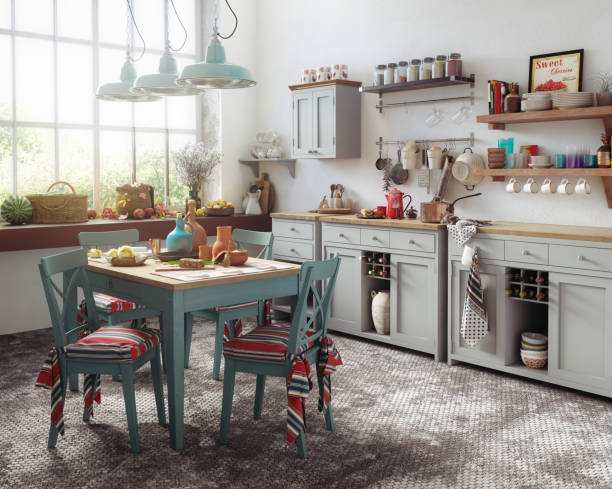

In [ ]:
display(Image("/content/gettyimages-cozinha.jpg"))


image 1/1 /content/gettyimages-cozinha.jpg: 512x640 3 bottles, 1 cup, 3 bowls, 2 chairs, 3 potted plants, 1 dining table, 172.7ms
Speed: 5.8ms preprocess, 172.7ms inference, 1.8ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs/detect/predict7


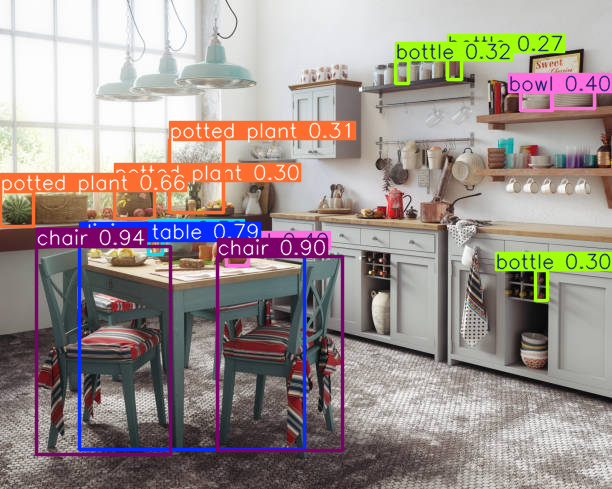

In [ ]:
model = YOLO("yolo11n.pt")  # n, s, m, l, x versions available

results = model.predict(source="/content/gettyimages-cozinha.jpg", save=True)

results[0].show()

In [ ]:
# lista objetos detectados e sua quantidade

results_list = []
for r in results:
    for c in r.boxes.cls:
        class_name = model.names[int(c)]
        results_list.append(class_name)

object_counts = {}
for obj in results_list:
    if obj in object_counts:
        object_counts[obj] += 1
    else:
        object_counts[obj] = 1

print("Objetos detectados e suas quantidades:")
for obj, count in object_counts.items():
    print(f"- {obj}: {count}")


Objetos detectados e suas quantidades:
- chair: 2
- dining table: 1
- potted plant: 3
- bowl: 3
- cup: 1
- bottle: 3


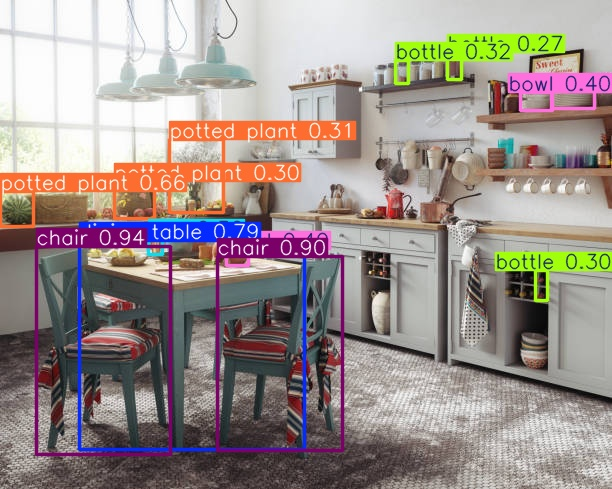

In [ ]:
display(Image("/content/runs/detect/predict7/gettyimages-cozinha.jpg")) # check o diretório

# Vídeos

In [ ]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open('/content/fruit-and-vegetable-detection-short.Mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)


WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/501) /content/fruit-and-vegetable-detection-short.Mp4: 384x640 (no detections), 161.7ms
video 1/1 (frame 2/501) /content/fruit-and-vegetable-detection-short.Mp4: 384x640 (no detections), 131.2ms
video 1/1 (frame 3/501) /content/fruit-and-vegetable-detection-short.Mp4: 384x640 (no detections), 128.7ms
video 1/1 (frame 4/501) /content/fruit-and-vegetable-detection-short.Mp4: 384x640 (no detections), 135.4ms
video 1/1 (frame 5/501) /con

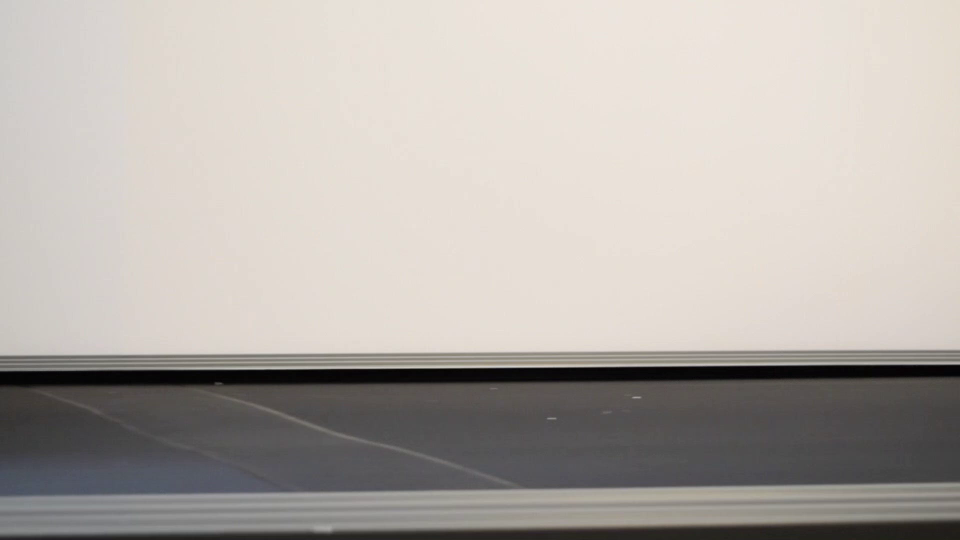

In [ ]:
model = YOLO("yolo11n.pt")  # n, s, m, l, x versions available

results = model.predict(source='/content/fruit-and-vegetable-detection-short.Mp4',save=True)

results[0].show()

Procure o arquivo .avi de resultado no diretório do GitHub... o Colab pode ter problemas para exibir o vídeo

In [ ]:
mp4 = open('/content/runs/detect/predict6/fruit-and-vegetable-detection-short.avi','rb').read()
data_url = "data:video/avi;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/avi">
</video>
""" % data_url)

In [ ]:
# for r in results:
#        boxes = r.boxes  # Boxes object for bbox outputs
#        masks = r.masks  # Masks object for segment masks outputs
#        probs = r.probs  # Class probabilities for classification outputs


In [ ]:
results_list = []
for r in results:
    for c in r.boxes.cls:
        class_name = model.names[int(c)]
        results_list.append(class_name)

object_counts = {}
for obj in results_list:
    if obj in object_counts:
        object_counts[obj] += 1
    else:
        object_counts[obj] = 1

print("Objetos detectados e suas quantidades:")
for obj, count in object_counts.items():
    print(f"- {obj}: {count}")



Objetos detectados e suas quantidades:
- bird: 90
- vase: 2
- apple: 145
- person: 3
- sports ball: 8
- broccoli: 32
- cake: 1


# Pose

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO("yolo11n-pose.pt")  # load an official model

# Predict with the model
results = model("https://ultralytics.com/images/bus.jpg",save=True)  # predict on an image

# Access the results
# for result in results:
#    xy = result.keypoints.xy  # x and y coordinates
#    xyn = result.keypoints.xyn  # normalized
#    kpts = result.keypoints.data  # x, y, visibility (if available)
# ...


Found https://ultralytics.com/images/bus.jpg locally at bus.jpg
image 1/1 /content/bus.jpg: 640x480 4 persons, 303.0ms
Speed: 14.0ms preprocess, 303.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs/pose/predict


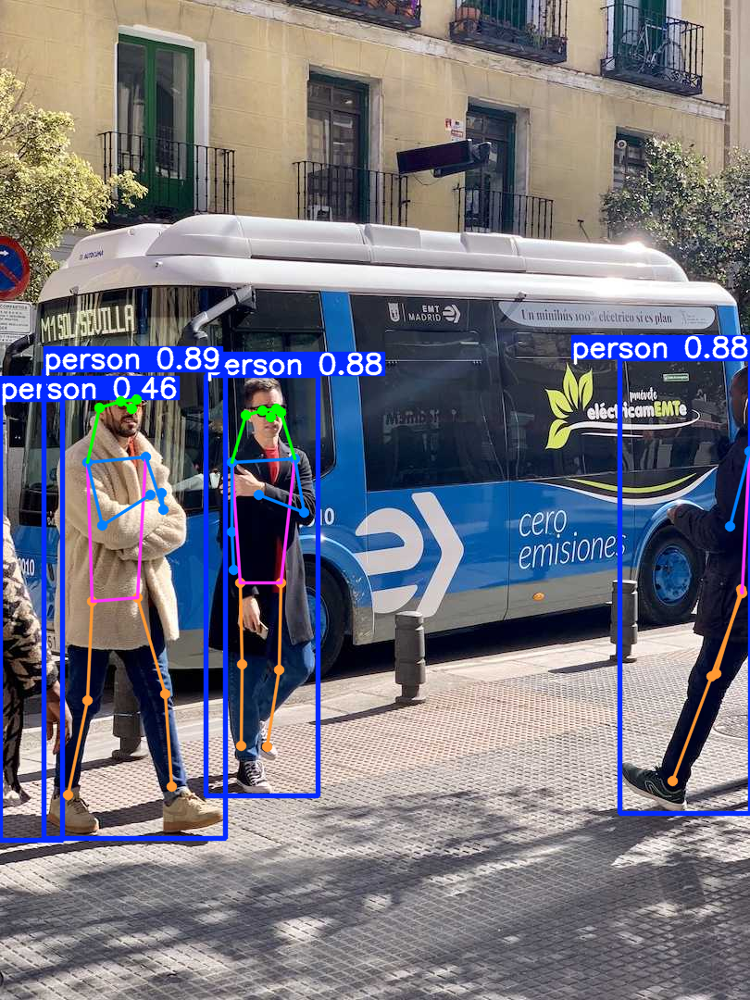

In [ ]:
results[0].show()